# **Globus Pallidus Neural Activity Analysis**

This notebook aims to quantify the oscillatory synchrony between GP neurons and the cortical EEG in the parkinsonian rats during Active state and SWA, as it has been shown that there is a strong abnormal oscillations in the beta range (12-30Hz). The project is divided in: 

1. EEG frequency spectrum
2. Spike trains sorting and crosscorrelations
3. Coherence between IFRs of spike trains
4. Filtering of the EEG signal (Bandpassing)
5. Calculation of the spike triggered average (STA)

To access the data files and code, we made a GitHub repository 
 https://github.com/cguerreromar/MiniProject2-Electrophysiological_Recordings_PFDA_2022.git

In order for the code to work, all the .mat files need to be stored in the same folder as the code.

## **1. EEG FREQUENCY SPECTRUM**

In [ ]:
#First, we import the necessary packages
import numpy as np
import scipy
import scipy.signal 
import h5py
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Then, we load the data from the drive in a dictionary. It will contain the activity recorded from parkinsonian rats as well as controls of:
# 1. Slow-wave activity (SWA), which is analogous to activity observed during natural sleep
# 2. Activation (Activ) which contains activity patterns that resemble those observed during the awake, behaving state.

data={'ActivPark': h5py.File('L23_f09_as_PARK.mat','r'), 
      'SWAPark': h5py.File('L23_f03_swa_PARK.mat','r'), 
     'ActivCtl': h5py.File('A9_c05_as_CTL.mat','r'), 
     'SWACtl': h5py.File('A9_c01_swa_CTL.mat','r')}

# We can now look at the variable names in each data file
for key,value in data.items():
    print(key)
    print(data[key].keys())

ActivPark
<KeysViewHDF5 ['L23_Beat_cycl', 'L23_Beta_EEG', 'L23_EEGipsi', 'L23_Pr18_c08', 'L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr20_c0B', 'L23_Pr23_c0E', 'L23_Pr25_c10', 'L23_Pr25_c11', 'L23_Pr26_c12', 'L23_SS_Pr_1', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_3', 'L23_SS_Pr_7', 'L23_SS_Pr_9']>
SWAPark
<KeysViewHDF5 ['L23_EEGipsi', 'L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr20_c0B', 'L23_Pr23_c0E', 'L23_Pr23_c0F', 'L23_Pr25_c10', 'L23_Pr25_c11', 'L23_SS_Pr_1', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_7']>
ActivCtl
<KeysViewHDF5 ['A9_EEGipsi', 'A9_P2021_c10', 'A9_P2021_c11', 'A9_Pr10_c0C', 'A9_Pr10_c0D', 'A9_Pr10_c0E', 'A9_Pr17_c01', 'A9_Pr17_c10', 'A9_Pr1_c01', 'A9_Pr22_c12', 'A9_Pr22_c13', 'A9_Pr2_c02', 'A9_Pr2_c1B', 'A9_Pr6_c05', 'A9_Pr8_c07', 'A9_Pr8_c08', 'A9_SS_Pr_25', 'A9_SS_Pr_3', 'A9_SS_Pr_4', 'A9_SS_Pr_9']>
SWACtl
<KeysViewHDF5 ['A9_EEGipsi', 'A9_P2021_c10', 'A9_P2021_c11', 'A9_Pr10_c0C', 'A9_Pr10_c0D', 'A9_Pr10_c0E',

In [ ]:
# Also we can look up a variable in a specific dataset
dict(data['ActivPark']['L23_Pr20_c09'])

{'comment': <HDF5 dataset "comment": shape (33, 1), type "<u2">,
 'length': <HDF5 dataset "length": shape (1, 1), type "<f8">,
 'resolution': <HDF5 dataset "resolution": shape (1, 1), type "<f8">,
 'times': <HDF5 dataset "times": shape (1, 725), type "<f8">,
 'title': <HDF5 dataset "title": shape (8, 1), type "<u2">}

In [ ]:
# Select a few datasets to work with: EEG and 3 spike trains from parkinsonian animals in 'activated state'
EEG=data['ActivPark']['L23_EEGipsi']
ST1=data['ActivPark']['L23_Pr20_c09']
ST2=data['ActivPark']['L23_Pr20_c0A']
ST3=data['ActivPark']['L23_Pr20_c0B']
dict(EEG)

{'comment': <HDF5 dataset "comment": shape (10, 1), type "<u2">,
 'interval': <HDF5 dataset "interval": shape (1, 1), type "<f8">,
 'length': <HDF5 dataset "length": shape (1, 1), type "<f8">,
 'offset': <HDF5 dataset "offset": shape (1, 1), type "<f8">,
 'scale': <HDF5 dataset "scale": shape (1, 1), type "<f8">,
 'start': <HDF5 dataset "start": shape (1, 1), type "<f8">,
 'title': <HDF5 dataset "title": shape (7, 1), type "<u2">,
 'units': <HDF5 dataset "units": shape (2, 1), type "<u2">,
 'values': <HDF5 dataset "values": shape (1, 35715), type "<f8">}

In [ ]:
# Then, we can find the number of sampling points in EEG trace using 'EEG[values]'
v = EEG['values']
values= v[0,:]             # vector containing EEG values
no_sp = len(values)        # assigning the No of sampling points to 'no_sp'
print("Number of sampling points: {}". format(no_sp)) 

Number of sampling points: 35715


In [ ]:
# We determine the duration of the recording as number of points time sampling interval using 'EEG[interval]'
i = EEG['interval']
sampling= i[0,0]                   # Extraction of the sampling interval
duration= int(sampling*no_sp)      # Calculation of recording duration
rateEEG= 1/sampling                # Calculation of the rate of EEG

print("Duration of Recording: {}s".format(duration))

Duration of Recording: 100s


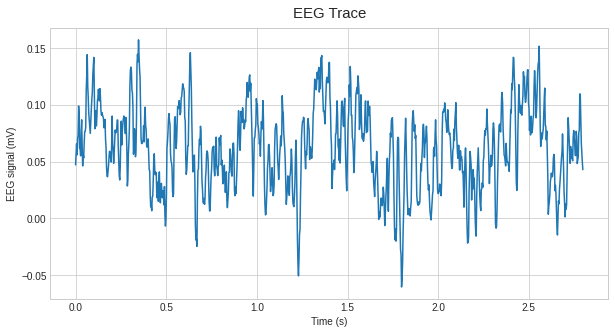

In [ ]:
# We plot the 1000 first points in EEG trace (aprox 25s)
t= np.linspace(0, duration, no_sp)
plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(10,5))
plt.plot(t[0:1000],v[0,:1000]);
plt.title("EEG Trace", fontsize = 15, pad=10)
plt.ylabel("EEG signal (mV)");
plt.xlabel("Time (s)");

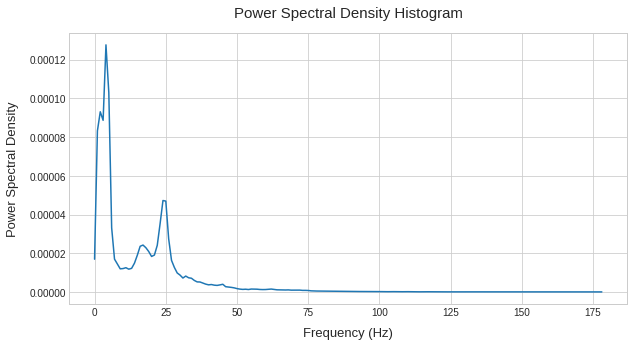

In [ ]:
# We then compute the spectral power density histogram (spectrum) of the EEG trace using 'scipy.signal.welch'. 
# This permits us to elucidate the power level of the frequencies present in the signal. 
f, Pxx_den = scipy.signal.welch(values, rateEEG, nperseg=357)
plt.figure(figsize=(10,5))
plt.plot(f, Pxx_den)

plt.title("Power Spectral Density Histogram", fontsize = 15, pad=15)
plt.xlabel("Frequency (Hz)", fontsize = 13, labelpad=10)
plt.ylabel("Power Spectral Density", fontsize = 13, labelpad=10);

## **2. SPIKE TRAINS SORTING AND CROSSCORRELATIONS**

In [ ]:
# We now want to look up the spike times for the three spike trains. 
#We create a vector with the times of the spikes (i.e., at which times there is an spike).
ST1_times = ST1['times'][0]
ST2_times = ST2['times'][0]
ST3_times = ST3['times'][0]


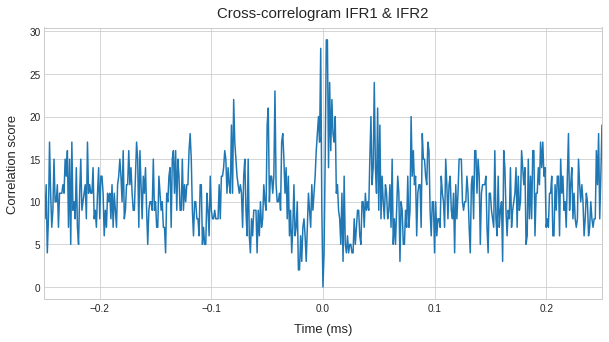

In [ ]:
# For the three spike trains, we calculate the instantaneous firing rate (IFR) in bins of 1 ms using the function 'np.histogram'.
IFR1, bins1=np.histogram(ST1_times, range = [0,100], bins =100000)
IFR2, bins2=np.histogram(ST2_times, range = [0,100], bins =100000)
IFR3, bins3=np.histogram(ST3_times, range = [0,100], bins =100000)

rateIFR= 1/0.001 #Calculating the IFR rate for next steps. In this way, we obtain the number of values in a second

# Then, we can proceed to plot the crosscorrelogram of instantaneous firing rate (IFR) of spike train 1 and IFR of spike train 2 for delays from -250ms to +250ms. 
# We use it to disentangle whether there is a relationship between two series. 

C= scipy.signal.correlate(IFR1, IFR2, mode='full', method='auto') #Calculating the correlation between IFR1 and IFR2
T = np.linspace(-len(IFR1)/rateIFR, +len(IFR1)/rateIFR , len(C))  #Making a time vector
plt.figure(figsize=(10,5))
plt.plot(T,C);
plt.xlim(-0.25,0.25);
plt.title('Cross-correlogram IFR1 & IFR2', fontsize = 15, pad=10)
plt.xlabel('Time (ms)', fontsize = 13, labelpad=10)
plt.ylabel('Correlation score', fontsize = 13, labelpad=10);

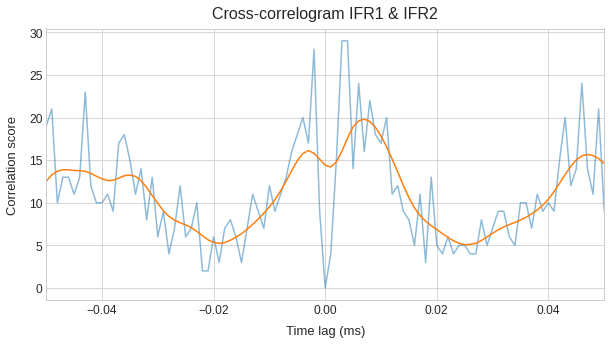

In [ ]:
# Smooth the crosscorrelogram of instantaneous firing rate (IFR) of spike train 1 and IFR of spike train 2 
# and plot for delays from -50ms to +50ms

##Creation of the Gaussian function

dt = 0.015 # Duration of the time window over which to smooth the signal
trange = int(dt*rateIFR) 
sigma = trange/4 # Standard deviation of the gaussian
window = np.arange(-trange//2,trange//2) # Actual temporal window over which to compute the Gaussian
gaussian = np.exp(-(window/sigma)**2)# Gaussian function over window and standard deviation sigma

##Convolution steps

C_=np.convolve(np.abs(C), gaussian, mode='same')/ gaussian.sum()
T = np.linspace(-len(IFR1)/rateIFR, +len(IFR1)/rateIFR , len(C_))
plt.figure(figsize=(10,5))
plt.plot(T,abs(C), alpha=0.5);
plt.plot(T, C_)
plt.xlim(-0.05,0.05);
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.title('Cross-correlogram IFR1 & IFR2', fontsize = 16, pad=10)
plt.xlabel('Time lag (ms)', fontsize = 13, labelpad=10)
plt.ylabel('Correlation score', fontsize = 13, labelpad=10);

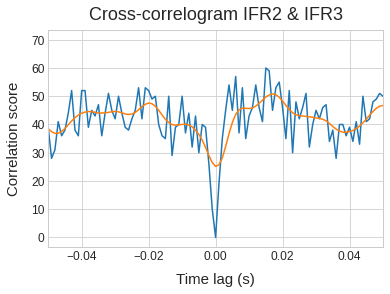

In [ ]:
# We repeat the same procedure for spike trains 2 and 3

# Crosscorrelogram of IFR2 and IFR 3
C2= scipy.signal.correlate(IFR2, IFR3, mode='full', method='auto')
T2 = np.linspace(-len(IFR2)/rateIFR, +len(IFR2)/rateIFR , len(C2))
plt.plot(T2,C2);
plt.xlim(-0.25,0.25)

# Convolution steps
C2_=np.convolve(np.abs(C2), gaussian, mode='same')/gaussian.sum()
T = np.linspace(-len(IFR2)/rateIFR, +len(IFR2)/rateIFR , len(C2_))
plt.plot(T,C2_);
plt.xlim(-0.05,0.05);
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.title('Cross-correlogram IFR2 & IFR3', fontsize = 18, pad=10)
plt.xlabel('Time lag (s)', fontsize = 15, labelpad=10)
plt.ylabel('Correlation score', fontsize = 15, labelpad=10);

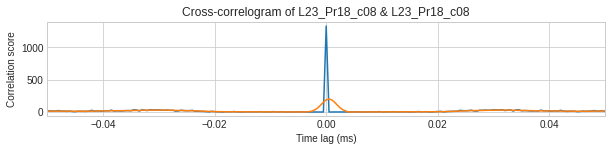

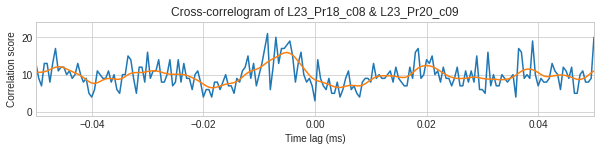

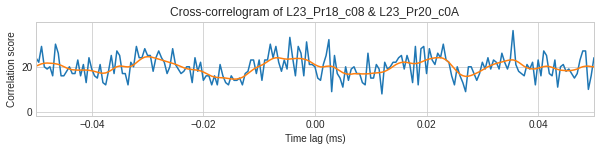

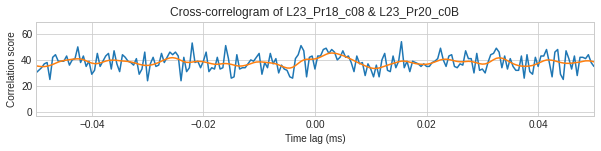

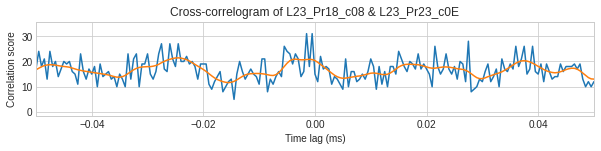

...

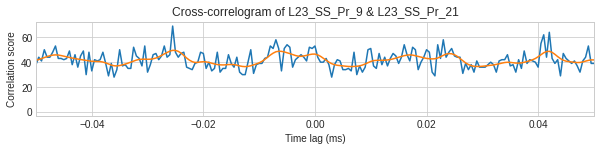

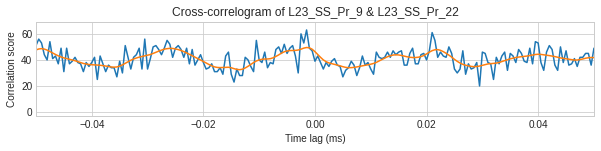

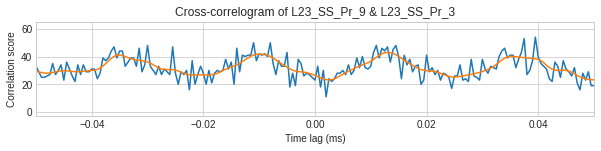

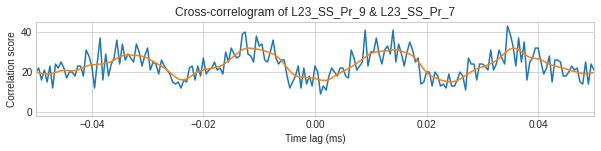

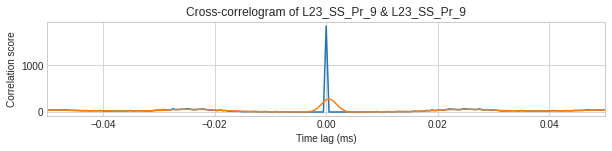

In [ ]:
# Then, we create a loop to repeat the procedure for all pairs of spike trains recorded in this file (ActivPark)
# To do this, we use the 'keys' of the dataset, corresponding to the various signals recorded simultaneously. 
# The first 3 signals correspond to EEG or filtered EEG and will not be considered here. All other recorded signals are spike trains. 
import warnings 
warnings.filterwarnings("ignore") #For the warning lines not to appear
keys=list(data['ActivPark'].keys()) # Keylist to iterate over
for x in keys[3:]:
  for y in keys[3:]:
    STx=data['ActivPark'][x] #ST1
    STx_times = STx['times'][0] #Times there was a spike on ST1
    IFRx, binsx=np.histogram(STx_times, range = [0,100], bins =100000) #IFR1 calculation
    STy=data['ActivPark'][y]
    STy_times = STy['times'][0]
    IFRy, binsy=np.histogram(STy_times, range = [0,100], bins =100000)
    Cxy=scipy.signal.correlate(IFRx, IFRy, mode='full', method='auto') #Correlation
    Cxy_=np.convolve(np.abs(Cxy), gaussian, mode='same')/ gaussian.sum() #Convolution
    Txy = .5*np.linspace(-len(IFRx)/rateIFR, +len(IFRx)/rateIFR , len(C2))
    plt.figure(figsize=(10,8))
    plt.subplot(411);
    plt.plot(Txy,Cxy);
    plt.xlim(-0.25,0.25)
    plt.plot(Txy, Cxy_);
    plt.xlim(-0.05,0.05)
    plt.title("Cross-correlogram of "+ "" + x+" & "+y)
    plt.xlabel('Time lag (ms)')
    plt.ylabel('Correlation score')

**Calculating all the crosscorrelograms...**

(Representative human calculator calculating calculations while the project calculation is happening)


In [ ]:
from IPython.display import Image
Image(url='https://i.makeagif.com/media/7-29-2021/HnxvrK.gif')

## **3. COHERENCE BETWEEN IFRs OF SPIKE TRAINS**

Corresponding frequency for maximal coherence [23.4375]


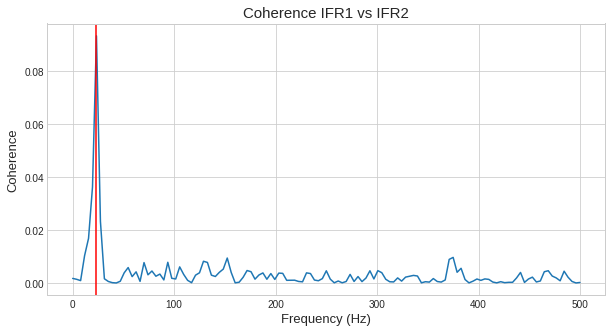

In [ ]:
# Now, we look the coherence between IFR1 and IFR2 with the function "scipy.signal.coherence"
f, Coher1_2 = scipy.signal.coherence(IFR1, IFR2, fs=rateIFR)
plt.figure(figsize=(10,5))
plt.plot(f,Coher1_2)
idx = np.where(np.abs(Coher1_2- np.max(Coher1_2))<=1e-6)

plt.axvline(x=f[idx], ymin=0, ymax=1, color='red');      # Plots a vertical line at maximal coherence 
plt.title('Coherence IFR1 vs IFR2', fontsize = 15)
plt.xlabel('Frequency (Hz)', fontsize = 13, labelpad=5)
plt.ylabel('Coherence', fontsize = 13, labelpad=5);
print("Corresponding frequency for maximal coherence", f[idx])       # To get the corresponding frequency of maximal coherence

Corresponding frequency for maximal coherence [23.71651786]


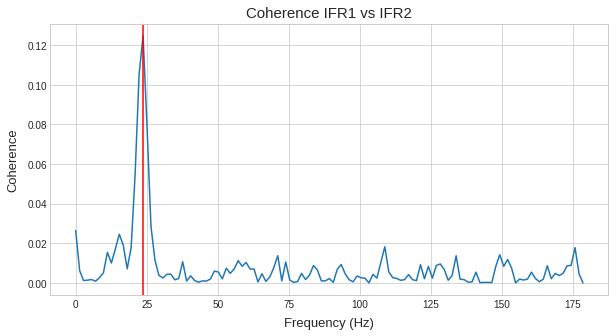

In [ ]:
# We compute the coherence between the EEG and the firing rates of single spike trains. 
# However, the coherence needs to be computed on signals that have the same sampling interval/rate

# First step: Recompute the IFR for a time bin similar to EEG sampling interval
IFR1_recalc, binsrecalc=np.histogram(ST1_times, range = [0,100], bins =35715) #Number of samples of EEG signal gives the new bin
IFR2_recalc, binsrecalc=np.histogram(ST2_times, range = [0,100], bins =35715)
IFR3_recalc, binsrecalc=np.histogram(ST3_times, range = [0,100], bins =35715)

# Second step: Look at the coherence between instantaneous firing rate of spike train 1 and IFR of spike train 2 with new time bin

f1, Coher1_2_ = scipy.signal.coherence(IFR1_recalc, IFR2_recalc, fs=rateEEG)
plt.figure(figsize=(10,5))
plt.plot(f1,Coher1_2_)
idx = np.where(np.abs(Coher1_2_- np.max(Coher1_2_))<=1e-6)
plt.axvline(x=f1[idx], ymin=0, ymax=1, color='red');                  # Plots a vertical line at maximal coherence
plt.title('Coherence IFR1 vs IFR2', fontsize = 15)
plt.xlabel('Frequency (Hz)', fontsize = 13, labelpad=8)
plt.ylabel('Coherence', fontsize = 13, labelpad=8);
print("Corresponding frequency for maximal coherence", f1[idx])              # Prints the corresponding frequence at maximal coherence


Corresponding frequency for maximal coherence [23.71651786]


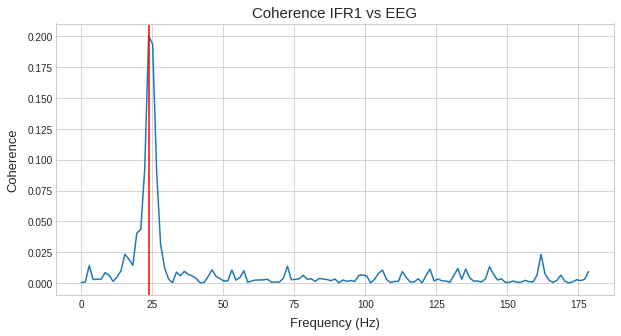

In [ ]:
# Now we compute the coherence between instantaneous firing rate (IFR) of a spike train and the EEG

f2, Coher1_EEG_ = scipy.signal.coherence(IFR1_recalc, values, fs=rateEEG)
plt.figure(figsize=(10,5))
plt.plot(f2, Coher1_EEG_);
idx1 = np.where(np.abs(Coher1_EEG_- np.max(Coher1_EEG_))<=1e-6)
plt.axvline(x=f2[idx1], ymin=0, ymax=1, color='red');
plt.title('Coherence IFR1 vs EEG', fontsize = 15)
plt.xlabel('Frequency (Hz)', fontsize = 13, labelpad=8)
plt.ylabel('Coherence', fontsize = 13, labelpad=8);
print("Corresponding frequency for maximal coherence", f2[idx1]) 


## **4. FILTERING OF THE EEG SIGNAL (BANDPASSING)**

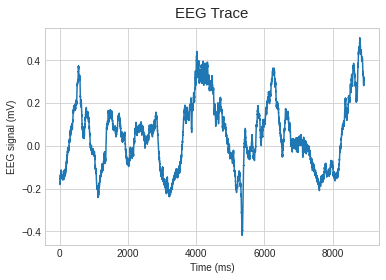

In [ ]:
# So far, we have been analysing data from the "active" brain state. From now on, we will look at EEG and Spike Trains from "SWA activity" state.
# First, we look up a file with SWA activity in the cortex, and plot the 5 first seconds of this EEG
EEG_SWA=data['SWAPark']['L23_EEGipsi'] #New EEG signal
EEG_data=EEG_SWA['values'][0]
EEG_interval=EEG_SWA['interval'][0]
EEG_frequency= 1/EEG_interval

plt.plot(EEG_data[:int(5/EEG_interval)]);
plt.title("EEG Trace", fontsize = 15, pad=10)
plt.ylabel("EEG signal (mV)");
plt.xlabel('Time (ms)');

In [ ]:
# We build a band pass filter with [0.5 1.5] Hz band for EEG using scipy.signal.butter

## Build a lowpass filter
def butter_lowpass(cutoff, fs, order=5):
    fnyq = 0.5 * fs
    normal_cutoff = cutoff / fnyq
    b, a = scipy.signal.butter(order, normal_cutoff, btype='low', output='ba', fs=2, analog=False)
    return b, a

## And a second function for high-pass filtering
def butter_highpass(cutoff, fs, order=5):
    fnyq = 0.5 * fs
    normal_cutoff = cutoff / fnyq
    b, a = scipy.signal.butter(order, normal_cutoff, btype='high', output='ba', fs=2, analog=False)
    return b, a

## This function filters the input data and returns the filtered sequence
def butter_filter(data, cutoff, fs, order=5, filtype=''):
    if filtype.lower()=='lowpass':
        b, a = butter_lowpass(cutoff, fs, order=order)
    elif filtype.lower()=='highpass':
        b, a = butter_highpass(cutoff, fs, order=order)        
        
    y = scipy.signal.filtfilt(b, a, data)
    return y
## And now a homemade function that returns a bandpassed signal!
def homemade_filter (data, lowcut, highcut, fs, interval, order=5):
    lowpassed=butter_filter(data, highcut, fs, order=5, filtype='lowpass')
    EEG_data2=butter_filter(lowpassed, lowcut, fs, order=5, filtype='highpass')
    return EEG_data2
  

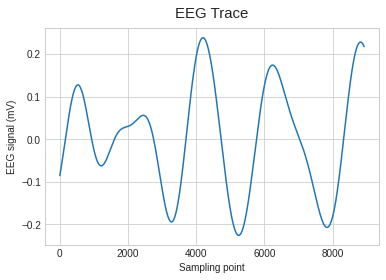

In [ ]:
# It is possible now to filter EEG with scipy.signal.filtfilt using the filter built, and plot first 5 s of filtered EEG
EEG_data2=homemade_filter(EEG_data, 0.5, 1.5, EEG_frequency, EEG_interval)
plt.plot(EEG_data2[:int(5/EEG_interval)]);
plt.title("EEG Trace", fontsize = 15, pad=10)
plt.ylabel("EEG signal (mV)");
plt.xlabel("Sampling point");


## **5. CALCULATION OF THE SPIKE-TRIGGERED AVERAGE**

3294
1.9998095999999999
98.0174096
-0.024225651780057977
[3571.42857143]


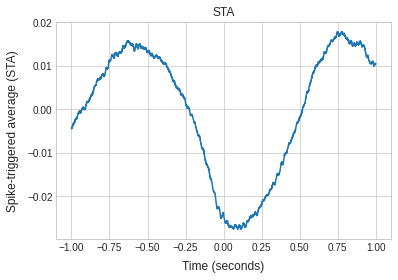

In [ ]:
# Let's load one spike train and the EEG values and sampling interval from the SWAPark file
ST1=data['SWAPark']['L23_Pr20_c09'] 
ST1_times=ST1['times'][0]
print(len(ST1_times))

EEG=data['SWAPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0]

# Now, we compute the spike-triggered average of the EEG trace with the first spike train. This allows us to relate the EEG signal and the simultaneously recorded spike trains.
#Concretely, it takes the signal during a small time (time window) before the spikes and averages with the spike. This gives us an idea of the stimulus that lead the neuron to fire.

windowsec=2; windowint=windowsec/EEG_interval; #We create a window around the time 0 (a given spike). The window has 2 seconds.
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval) #From -1 to 1
STA=np.zeros(int(windowint)) #Vector full of 0s to fill in later
i1=np.argmin(np.abs(ST1_times-windowsec))
i2=np.argmin(np.abs(ST1_times-(len(EEG_data)*EEG_interval-windowsec)))
print(ST1_times[i1]);
print(ST1_times[i2]);
for i in range(i1,i2): #we extract the values between indexes i1 and i2 from EEG_data. STA will be filled progressively.
    STA += EEG_data[int(ST1_times[i+1]/EEG_interval)-int(windowint/2)-1:int(ST1_times[i+1]/EEG_interval)+int(windowint/2)]

#Normalisation of the STA
STA=STA/(len(ST1_times)-2)
STA=STA-np.mean(STA)
plt.plot(t,STA);
plt.title('STA')
plt.xlabel('Time (seconds)', fontsize = 12, labelpad=8)
plt.ylabel('Spike-triggered average (STA)', fontsize = 12, labelpad=8);

#Value of the spike-triggered average at 0 time lag
print(STA[int(windowint/2)])
print(windowint)


{'L23_Pr20_c09': -0.024225651780057977,
 'L23_Pr20_c0A': -0.07324562915552801,
 'L23_Pr20_c0B': 0.10212848066337073,
 'L23_Pr23_c0E': -0.056443753725938024,
 'L23_Pr23_c0F': -0.08166482712028889,
 'L23_Pr25_c10': -0.06753157917015612,
 'L23_Pr25_c11': 0.16198437342754568,
 'L23_SS_Pr_1': 0.15617695252435826,
 'L23_SS_Pr_11': -0.007583152533646213,
 'L23_SS_Pr_17': -0.09443011284319613,
 'L23_SS_Pr_21': -0.05386067485353443,
 'L23_SS_Pr_22': -0.056365244262851145,
 'L23_SS_Pr_7': -0.056936422244619825}

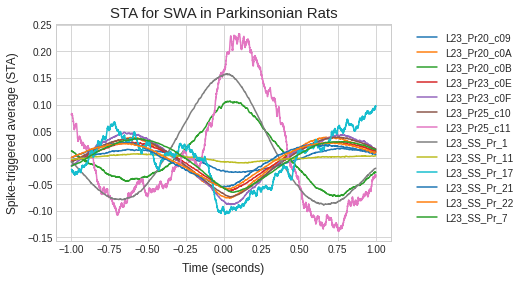

In [ ]:
# Creating a loop to compute and plot the spike-triggered averages (STA) of the EEG with respect to all spike trains recorded in this SWAPark file
# We save the value of the spike-triggered average at 0 time lag for all considered spike trains
keys=list(data['SWAPark'].keys())
STAdict={}        #Dictionnary to add all STA values for each train
for x in keys[1:]:
  STx=data['SWAPark'][x]
  STx_times = STx['times'][0]

  EEG=data['SWAPark'][keys[0]]
  EEG_data=EEG['values'][0]
  EEG_interval=EEG['interval'][0]
  windowsec=2; windowint=windowsec/EEG_interval; 
  t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval)
  STAx=np.zeros(int(windowint))
  x1=np.argmin(np.abs(STx_times-windowsec))
  x2=np.argmin(np.abs(STx_times-(len(EEG_data)*EEG_interval-windowsec)))
  for i in range(x1,x2):
    STAx += EEG_data[int(STx_times[i+1]/EEG_interval)-int(windowint/2)-1:int(STx_times[i+1]/EEG_interval)+int(windowint/2)]

  STAx=STAx/(len(STx_times)-2)
  STAx=STAx-np.mean(STAx)
  plt.plot(t,STAx, label=str(x));
  plt.title('STA for SWA in Parkinsonian Rats', fontsize = 15)
  plt.xlabel('Time (seconds)', fontsize = 12, labelpad=8)
  plt.ylabel('Spike-triggered average (STA)', fontsize = 12, labelpad=8);
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
  value= STAx[int(windowint/2)]
  STAdict[str(x)] = value
  
STAdict


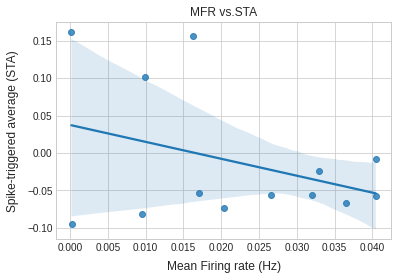

In [ ]:
# We then, for each spike train in the data set, compute the mean firing rate 
STMeandict={}
for x in keys[1:]:
  STx=data['SWAPark'][x]
  STx_times = STx['times'][0]
  IFRx, binsx=np.histogram(STx_times, range = [0,100], bins =100000)
  value= (IFRx.sum())/len(IFRx)
  STMeandict[str(x)] = value

STAValues= list(STAdict.values())
STMeanValues= list(STMeandict.values())

# Plot the mean firing rate of the spike trains vs the value of the spike-triggered average at 0 time lag

sns.regplot(STMeanValues, STAValues) 
plt.title('MFR vs.STA')
plt.xlabel('Mean Firing rate (Hz)', fontsize=12, labelpad=8)
plt.ylabel('Spike-triggered average (STA)', fontsize=12, labelpad=8);
